## Top2Vec Model Abstracts and Titles

In [ ]:
# uncomment this is if you did not install Top2Vec model already
# !pip install top2vec

In [2]:
import pandas as pd
import numpy as np
from top2vec import Top2Vec
import time

/share/apps/rc/software/Anaconda3/2020.07/envs/deepNLP2020/lib/python3.7/site-packages/torch/cuda/__init__.py:52: UserWarning: CUDA initialization: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx (Triggered internally at  /pytorch/c10/cuda/CUDAFunctions.cpp:100.)
  return torch._C._cuda_getDeviceCount() > 0


The location of the file is needed to change the paameters in the file. After changing the parameters, the file needs to saved and also restart the kernel in order to run the code with the new paameters.

In [2]:
import inspect

print (inspect.getmodule(Top2Vec).__file__)

/home/abulut/.local/lib/python3.7/site-packages/top2vec/Top2Vec.py


In [3]:
%%time
# Deleted 2332 rows bc of Publication Date format was not meaningful, 4 rows 
# deleted bc the date was early 2019 which is not the focus
df=pd.read_excel('AbstractsCleanUpdatednew.xlsx', usecols=['Publication Date','Title','Abstract'])
# 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62454 entries, 0 to 62453
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Publication Date  62454 non-null  datetime64[ns]
 1   Title             62454 non-null  object        
 2   Abstract          62454 non-null  object        
dtypes: datetime64[ns](1), object(2)
memory usage: 1.4+ MB
CPU times: user 19.2 s, sys: 314 ms, total: 19.5 s
Wall time: 26.6 s


## ABSTRACTS

In [4]:
%%time
# reading the file
df=pd.read_excel('AbstractsCleanUpdatednew.xlsx',  usecols=['Abstract'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62454 entries, 0 to 62453
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Abstract  62454 non-null  object
dtypes: object(1)
memory usage: 488.0+ KB
CPU times: user 19.5 s, sys: 277 ms, total: 19.7 s
Wall time: 39.2 s


In [5]:
# Convert to a list
abstract = df.Abstract.to_list()

In [8]:
%%time
# RUNNING with UMAP&HDBSCA=30, min_count=30

abstracts = Top2Vec(documents=abstract, speed="learn", workers=8, min_count=30)

2020-11-30 21:47:16,085 - top2vec - INFO - UMAP 15 Pre-processing documents for training
2020-11-30 21:48:05,022 - top2vec - INFO - Creating joint document/word embedding
2020-11-30 22:52:02,653 - top2vec - INFO - Creating lower dimension embedding of documents
2020-11-30 22:53:32,306 - top2vec - INFO - Finding dense areas of documents
2020-11-30 22:53:47,763 - top2vec - INFO - Finding topics


CPU times: user 2h 3min 35s, sys: 36.6 s, total: 2h 4min 11s
Wall time: 1h 6min 33s


In [9]:
abstracts.save('abstracts_umap35_mincount30')

In [ ]:
num_top = abstracts.get_num_topics()
print(num_top)
# By summing all the cosine score for each word then dividing by (the found number of topics * 50)
# calculating the average number of similarity of each word.
top_score = abstracts.topic_word_scores.sum()/(num_top*50)
top_score

In [ ]:
abstracts.generate_topic_wordcloud(0)

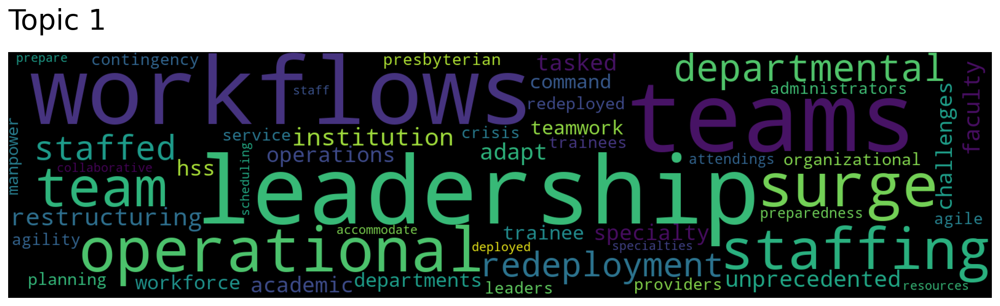

In [9]:
abstracts.generate_topic_wordcloud(1)

0.3892628340287642


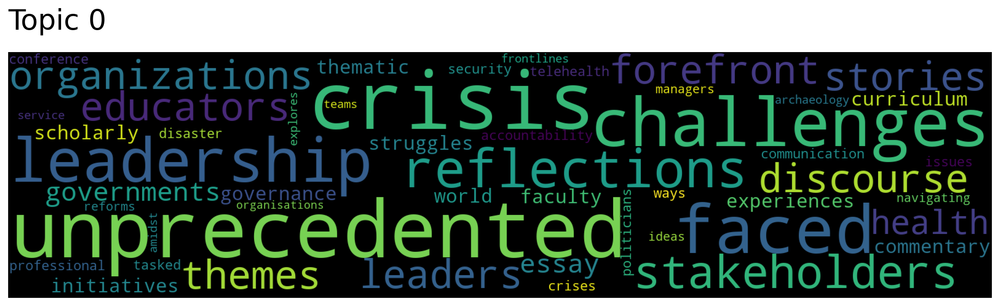

In [10]:
abstracts.hierarchical_topic_reduction(11)
w,s,n = abstracts.get_topics(reduced=True)
print(s.sum()/(50*11))
abstracts.generate_topic_wordcloud(0, reduced=True)

### Some of the Tried Parameters

UMAP&HDBSCA=15 mincount=50, speed=learn, topicFound=353,acuracy=0.423, red_acu=0.427

UMAP&HDBSCA=20 mincount=50, speed=learn, topicFound=353,acuracy=0.348, red_acu=0.285( I saved this one as 'abstracts_umap15_mincount50' by mistake)

UMAP&HDBSCA=20 mincount=30, speed=learn, topicFound=353,acuracy=0.461, red_acu=0.446(BEST SO FAR)

UMAP&HDBSCA=25, VECTOR_SIZE=400, speed=learn, topicFound=257,acuracy= 0.368 ,red_acu=0.306

UMAP&HDBSCA=30, speed=learn,mincount=30 topicFound=236 ,acuracy=.446  ,red_acu=.389(GOOD)

In [3]:
# Reading from the file
model = Top2Vec.load('abstracts_umap35_mincount30')

In [4]:
model.hierarchical_topic_reduction(11)

[[155,
  16,
  12,
  196,
  200,
  125,
  69,
  54,
  186,
  35,
  163,
  142,
  105,
  64,
  75,
  88,
  102,
  133,
  82,
  68,
  195,
  96,
  170,
  112,
  185,
  177,
  137,
  93,
  6,
  161,
  41,
  123,
  91,
  115,
  144,
  65,
  190,
  173,
  198,
  164,
  87,
  172,
  18,
  21,
  84,
  37,
  148,
  1],
 [138,
  147,
  66,
  11,
  99,
  9,
  188,
  44,
  171,
  150,
  45,
  136,
  92,
  58,
  57,
  175,
  135,
  51,
  52,
  124,
  192,
  131,
  169,
  89,
  4],
 [25,
  134,
  159,
  187,
  3,
  101,
  63,
  183,
  109,
  119,
  118,
  129,
  179,
  108,
  106,
  28,
  154,
  76,
  141,
  166,
  77,
  116,
  193,
  121,
  42,
  199,
  23,
  127,
  152,
  126,
  178,
  50,
  162,
  149,
  182,
  55],
 [85, 19, 0, 10, 49, 103, 110, 73, 184, 38, 107, 2],
 [90, 98, 130, 167, 14, 31, 117, 176, 20, 70, 5, 81, 62, 56, 153, 46],
 [128, 146, 27, 100, 157, 34, 7],
 [24, 33, 174, 113, 122, 132, 191, 22],
 [74, 8, 83, 32, 29, 194, 43, 78, 165, 30],
 [61, 189, 17, 48, 120, 151, 158, 168, 13]

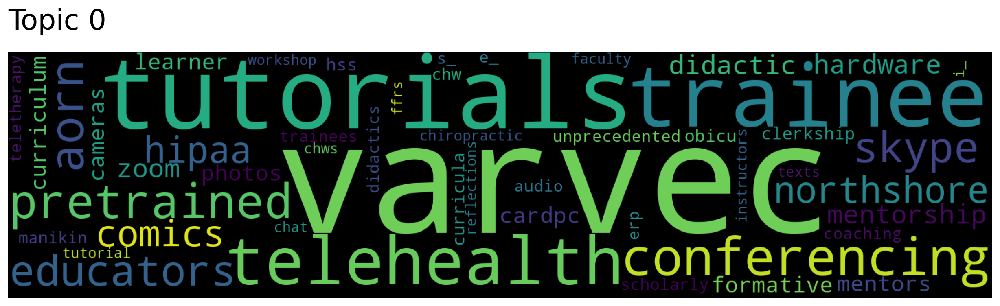

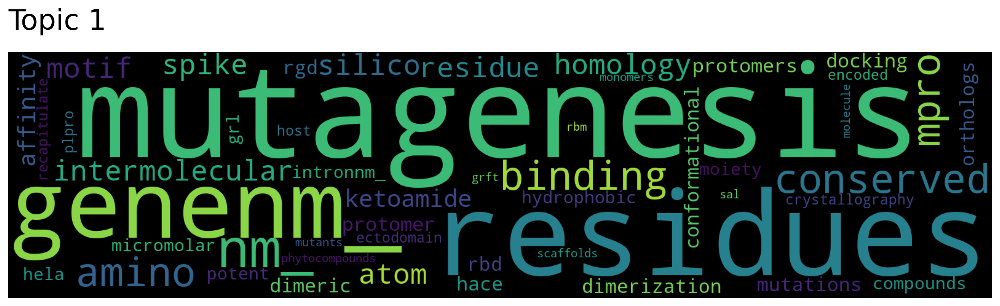

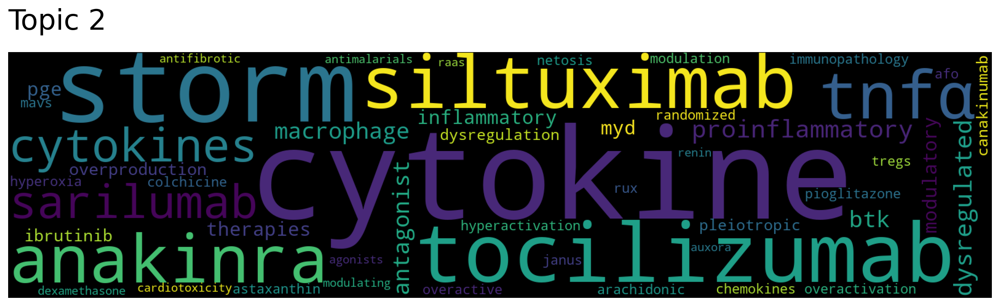

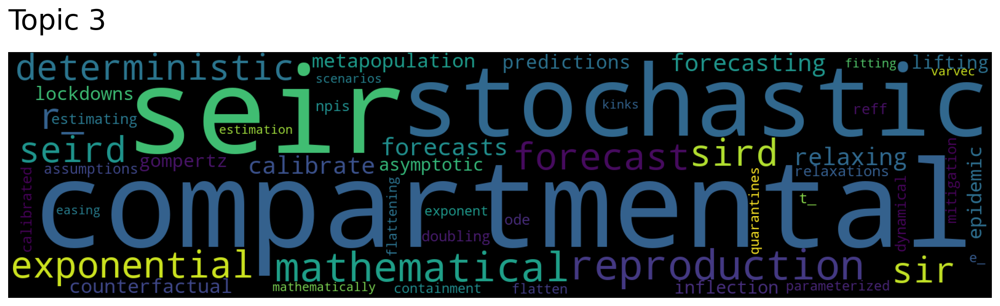

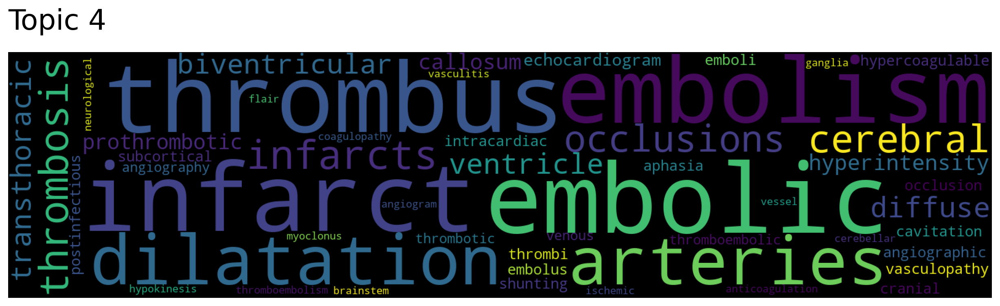

...

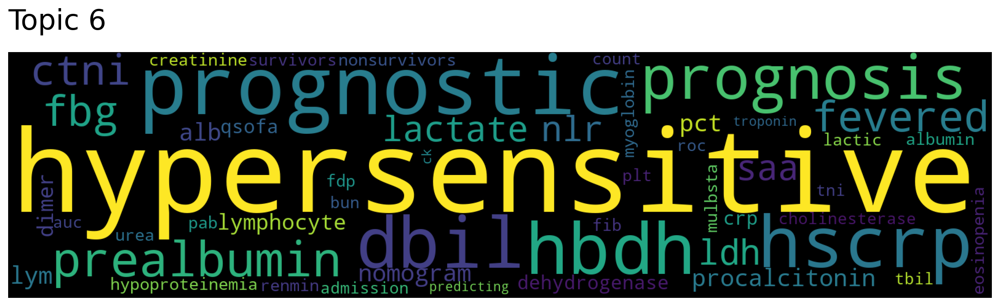

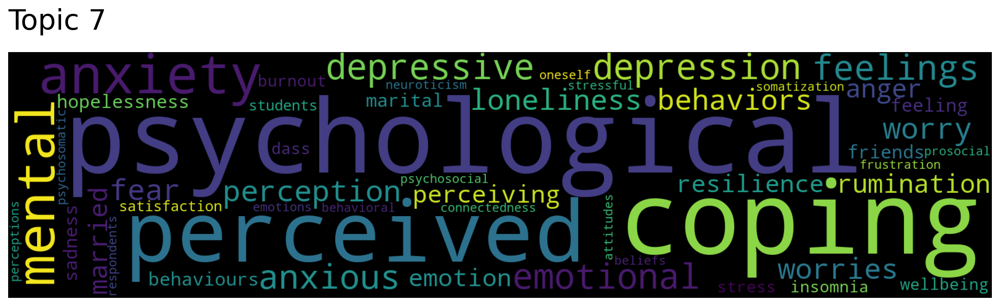

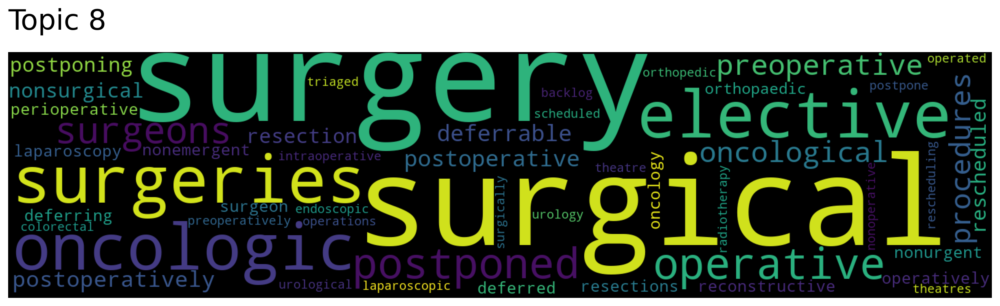

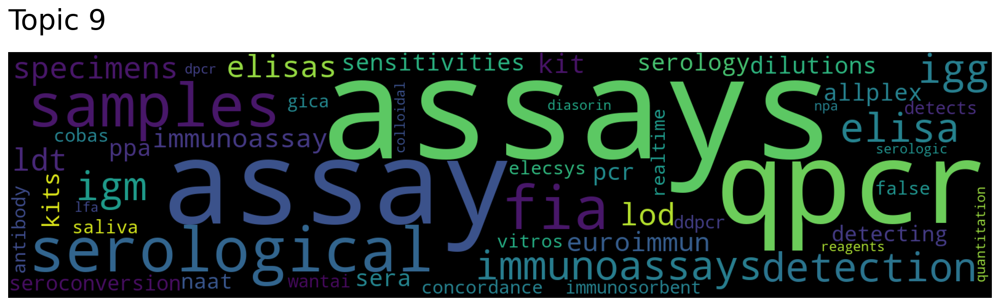

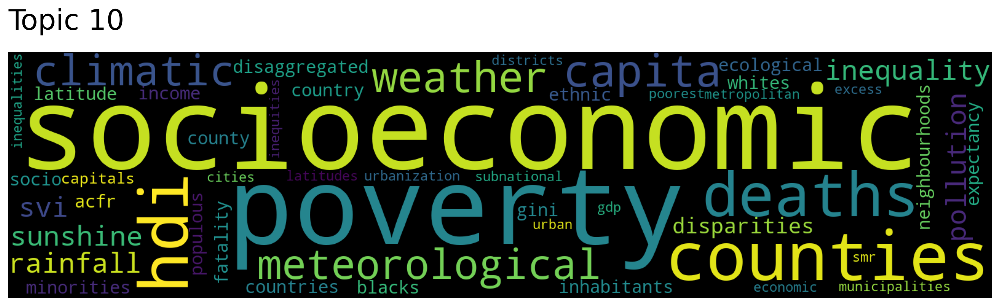

In [6]:
for i in range(11):
    model.generate_topic_wordcloud(topic_num=i,reduced=True)


In [8]:
documents, document_scores, document_ids = model.search_documents_by_topic(topic_num=7
                                                                           ,reduced=True, num_docs=10)
print(documents)
print(document_scores)
print(document_ids)

['The physical and mental health risks of COVID-19 become higher as people are asked to stay home for an indefinite period. The objective was to investigate the link between the four-factor structure model of coping and mental health among those living in lockdown. The sample was comprised of 100 participants. The data was collected through purposive sampling. Mental health was measured by the Depression, Anxiety and Stress Scale (DASS-21) and coping strategies from the Brief Cope Inventory. A personal information questionnaire was also used to gather information about the characteristics of participants, such as age, gender and education, in addition to questions related to other stressors. Linear regression was used to assess the association between variables. A P-value &lt; .05 was considered statistically significant. Overall, the results showed high levels of stress, anxiety and depression among participants. These findings revealed a significant association between active avoidan

In [40]:
model.doc_dist_reduced.sum().mean()/62344

0.3389921556705537

## TITLES

In [4]:
%%time
# reading the file
df=pd.read_excel('AbstractsCleanUpdatednew.xlsx',  usecols=['Title'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62454 entries, 0 to 62453
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Title   62454 non-null  object
dtypes: object(1)
memory usage: 488.0+ KB
CPU times: user 18.8 s, sys: 337 ms, total: 19.1 s
Wall time: 19.2 s


In [5]:
# Convert to a list
titles = df.Title.to_list()

In [6]:
%%time

# RUNNING with UMAP&HDBSCA=20, min_count=50
titles = Top2Vec(documents=titles, speed="learn", workers=8, min_count=30)

2020-12-01 01:43:51,899 - top2vec - INFO - UMAP 35 VectorSize200 Pre-processing documents for training
2020-12-01 01:43:55,322 - top2vec - INFO - Creating joint document/word embedding
2020-12-01 01:47:17,140 - top2vec - INFO - Creating lower dimension embedding of documents
2020-12-01 01:48:41,429 - top2vec - INFO - Finding dense areas of documents
2020-12-01 01:48:56,154 - top2vec - INFO - Finding topics


CPU times: user 5min 37s, sys: 1min 4s, total: 6min 41s
Wall time: 5min 4s


In [7]:
titles.save('titles_umap35_vectorsize200_mincount30')

In [9]:
num_top = titles.get_num_topics()
print(num_top)
top_score = titles.topic_word_scores.sum()/(num_top*50)
top_score

225


0.34753467881944444

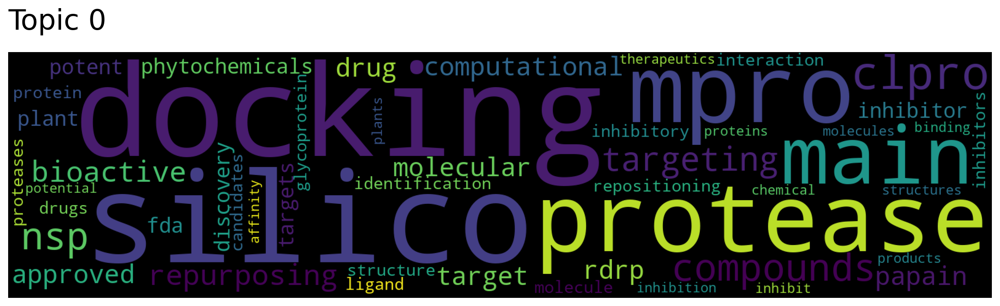

In [9]:
titles.generate_topic_wordcloud(0)

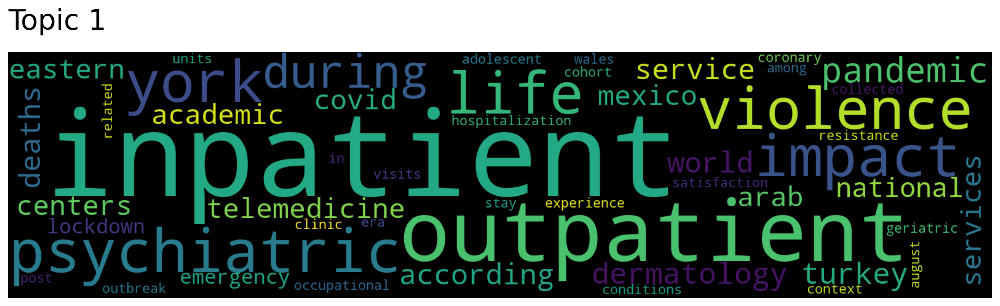

In [10]:
titles.generate_topic_wordcloud(1)

0.3879553500088778


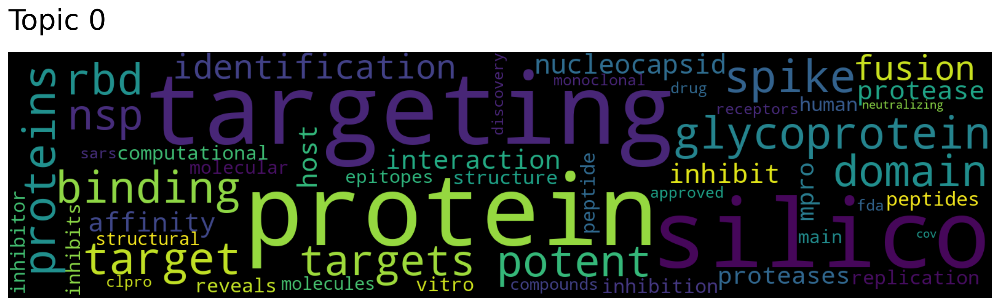

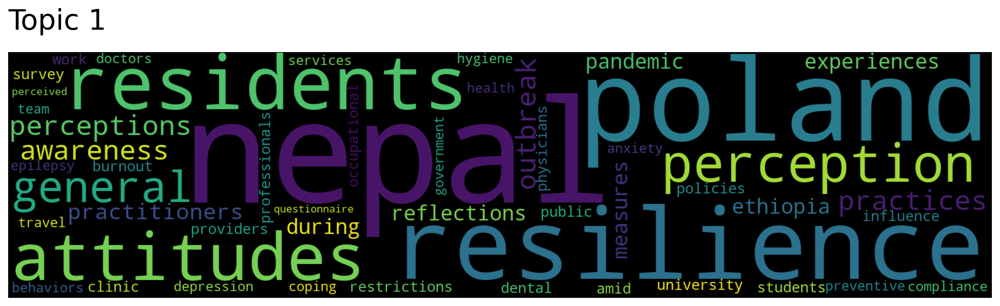

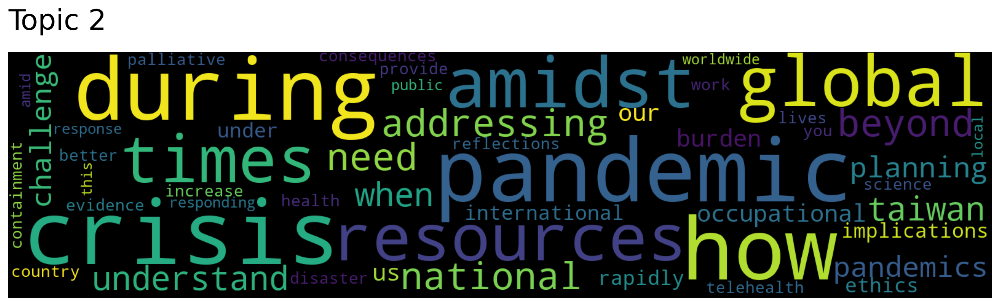

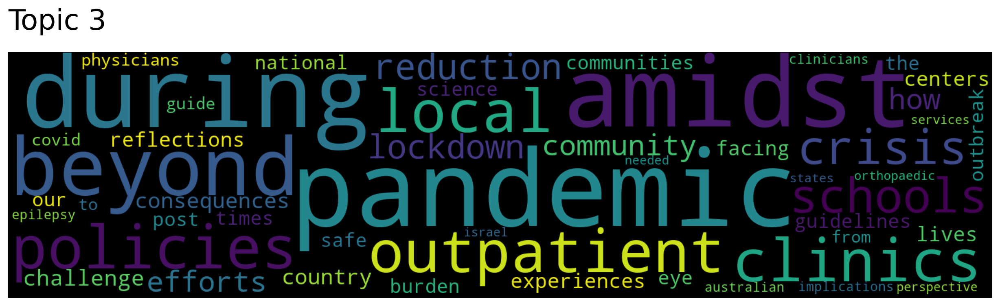

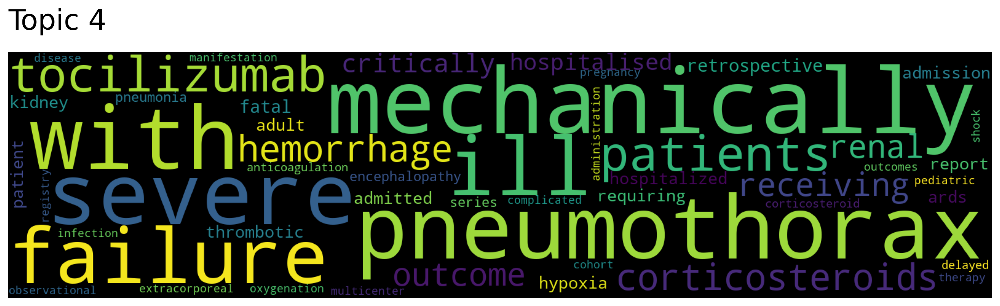

...

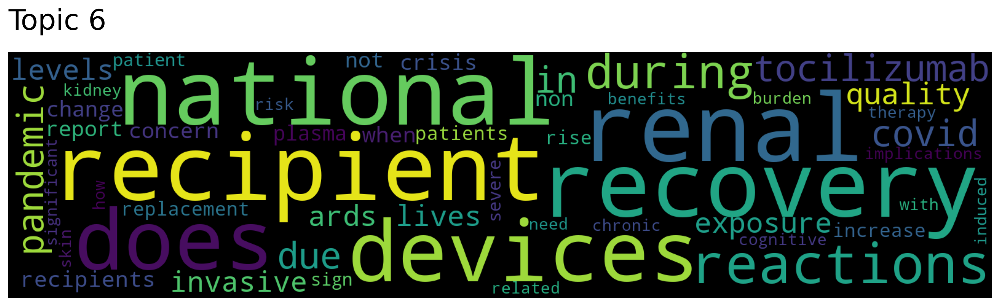

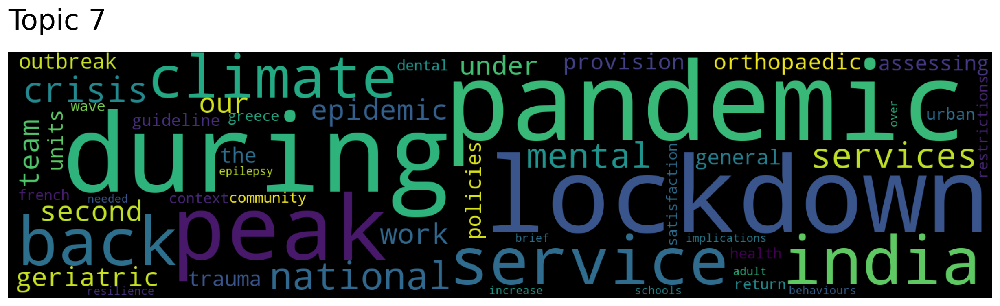

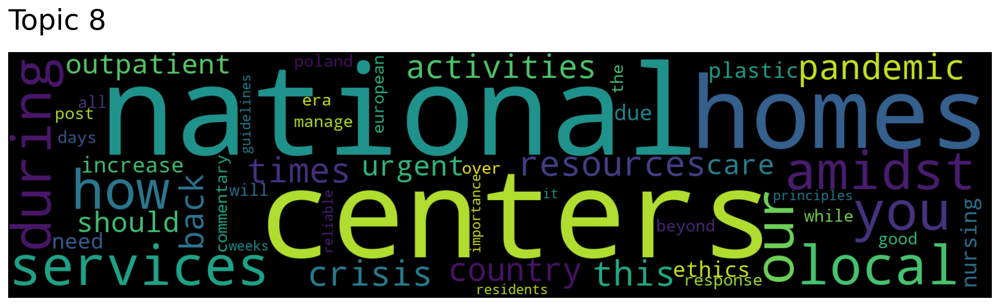

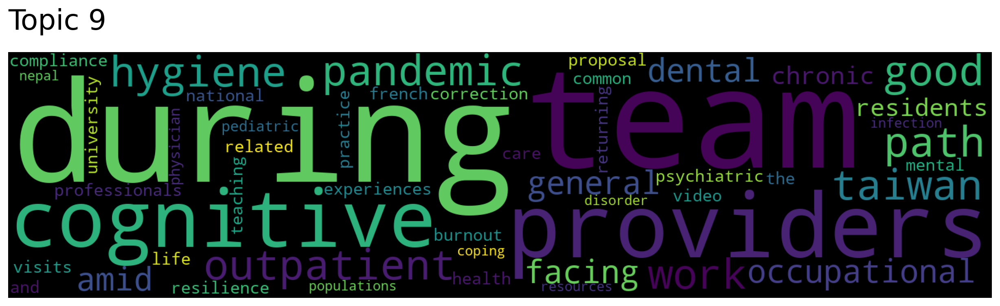

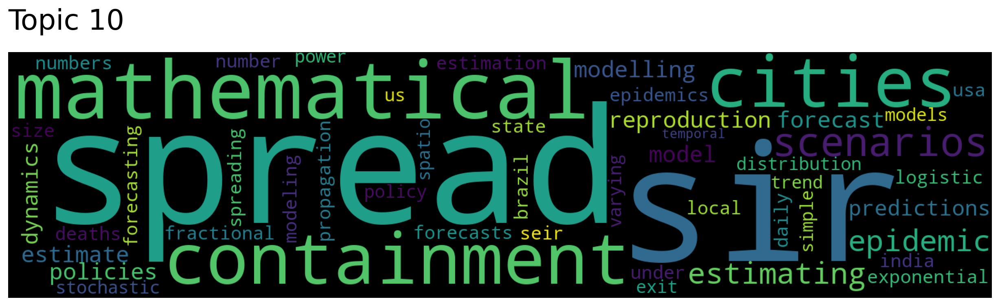

In [12]:
titles.hierarchical_topic_reduction(11)
w,s,n = titles.get_topics(reduced=True)
print(s.sum()/(50*11))
for i in range(11):
    titles.generate_topic_wordcloud(i, reduced=True)

### Some of the tried parameters

UMAP&HDBSCA=20 mincount=50, speed=learn, topicFound=335,acuracy=0.392, red_acu=0.398.(I saved this one as 'titles_umap15_mincount50' by mistake)

UMAP&HDBSCA=20 mincount=30, speed=learn, topicFound=491,acuracy=0.362, red_acu=0.37.

UMAP&HDBSCA=15, speed=learn,mincount=30 topicFound= 670,acuracy= .362 ,red_acu=.343

UMAP&HDBSCA=15, speed=learn,mincount=40 topicFound= 505,acuracy= .382 ,red_acu=.41

UMAP&HDBSCA=15, speed=learn,mincount=50 topicFound= 470,acuracy= .396 ,red_acu=.41(WINNER)